Copyright (c) 2020 Ryan Cohn and Elizabeth Holm. All rights reserved. <br />
Licensed under the MIT License (see LICENSE for details) <br />
Written by Ryan Cohn

# Instance Segmentation of Powder Particles and Satellites

This example will take you through the process of training a model to segment powder particles and visualizing the model predictions.

In [1]:
## regular module imports
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import pickle
import skimage.io
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.structures import BoxMode

root = '../'
sys.path.append(root)

from sat_helpers import data_utils, visualize, export_anno

%matplotlib inline

# Labeling Data

The [VGG Image Annotator](http://www.robots.ox.ac.uk/~vgg/software/via/) was used to generate particle labels. The a

# Loading Data
The process for training models for powder particles and satellites is identical. Enter the corresponding value depending on which model you want to train. <br />
The paths to individual images, and all annotation data are stored in the JSON files generated by the VGG image annotator.



In [2]:
EXPERIMENT_NAME = 'satellite' # can be 'particle' or 'satellite'
json_path_train = Path(root, 'data', 'VIA', 'satellite_training.json')  # path to training data
json_path_val = Path(root, 'data', 'VIA', 'satellite_validation.json')  # path to training data
assert json_path_train.is_file(), 'training file not found!'
assert json_path_val.is_file(), 'validation file not found!'


## Model Configuration
This is where we specify the directory where the outputs are saved, various hyperparameters for the model, and more.

In [3]:
cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.INPUT.MASK_FORMAT = 'polygon'  # masks generated in VGG image annotator are polygons
cfg.SOLVER.IMS_PER_BATCH = 1 # number of images per batch (across all machines)
cfg.SOLVER.CHECKPOINT_PERIOD = 1000  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cuda'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 250  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
cfg.SOLVER.MAX_ITER = 5000  # maximum number of iterations to run during training
                            # Increasing this may improve the training results, but will take longer to run (especially without a gpu!)
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.PANOPTIC_FPN.COMBINE.INSTANCES_CONFIDENCE_THRESH = 0.5
# model weights will be downloaded if they are not present
weights_path = Path('..','models','model_final_f10217.pkl')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path(root,'Models', 'SALAS_model-1'))
# make the output directory
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)

Weights not found, weights will be downloaded from source: https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl


# Model Training
This is to be run only after a model has already been trained. If you have not already, train a model with that demo. 

# Creating Predictor Object
We can create a predictor object with the configurations established above and the weights that were just created

In [4]:
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
#cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # predictor requires this field to not be empty
cfg.MODEL.WEIGHTS = str(model_checkpoints[-1])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.

predictor = DefaultPredictor(cfg)  # create predictor object

# Saving predictions to JSON format
We can convert all predictions into JSON format and have them downloadable to VIA

Annotating: HP743_10S_250x


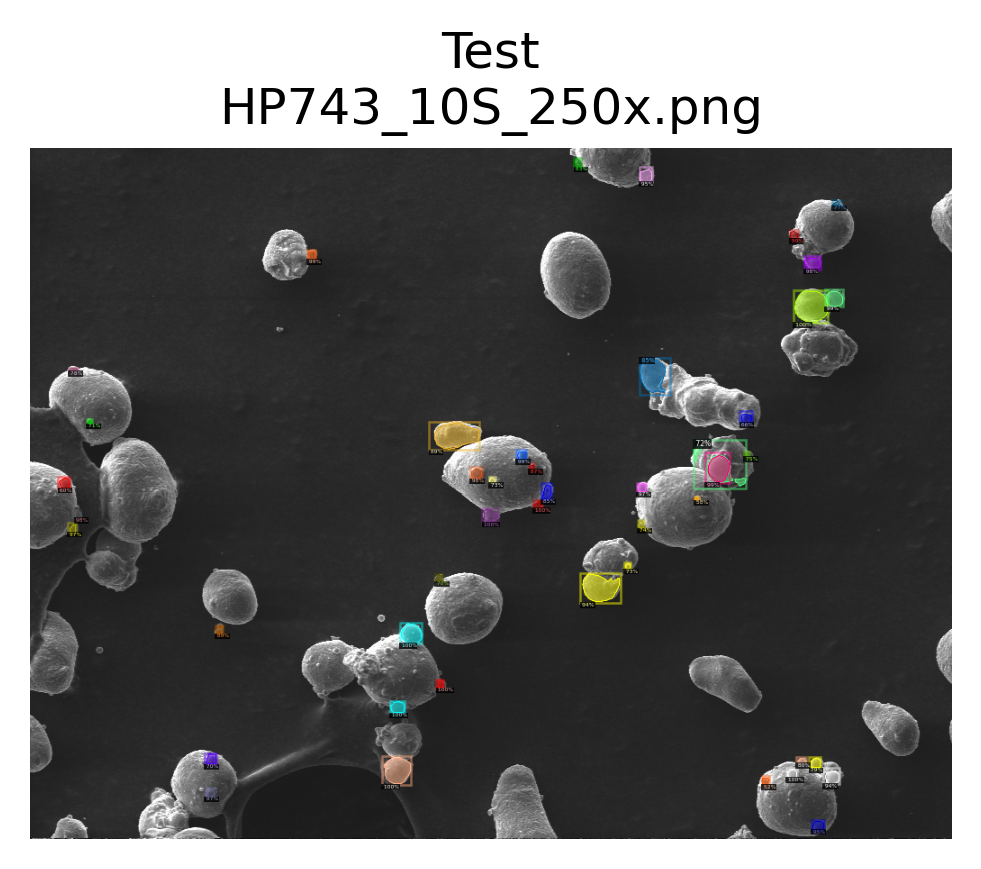

ddict info:
	path: ../data/SEM/HP743_10S_250x.png
	num_instances: 45
Annotating: HP743_10S_500x


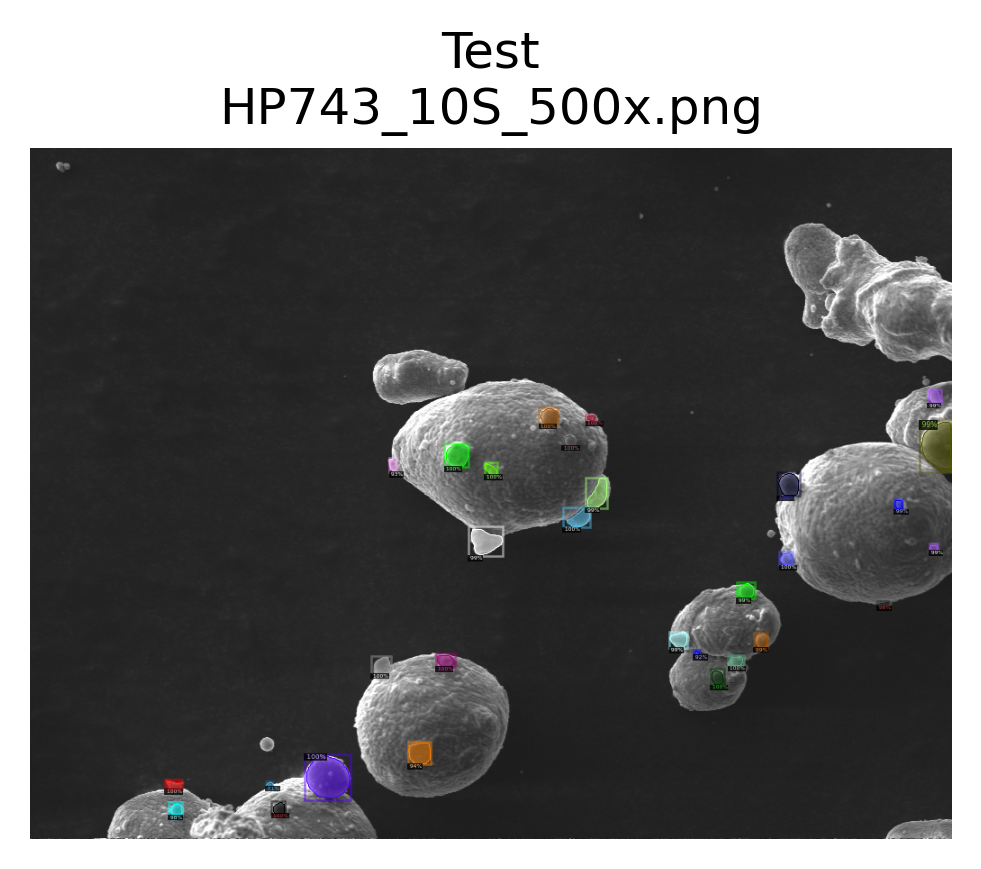

ddict info:
	path: ../data/SEM/HP743_10S_500x.png
	num_instances: 30
Annotating: HP743_11S_250x


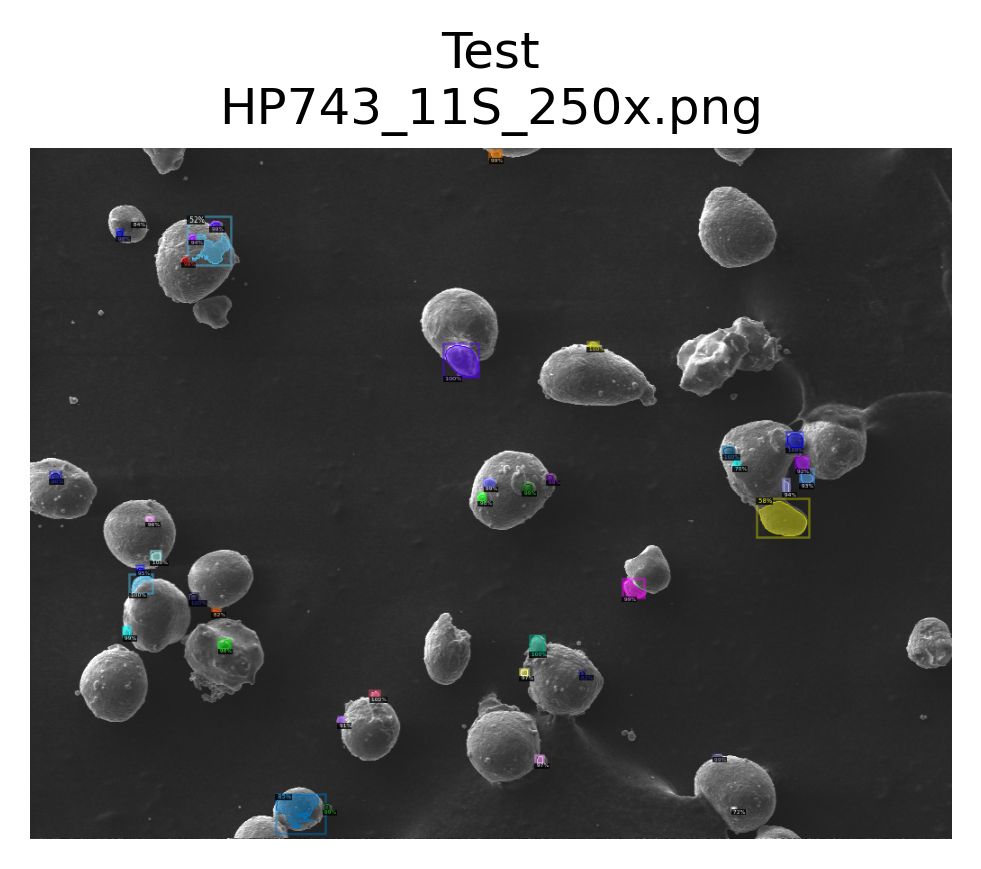

ddict info:
	path: ../data/SEM/HP743_11S_250x.png
	num_instances: 40
Annotating: HP743_11S_500x


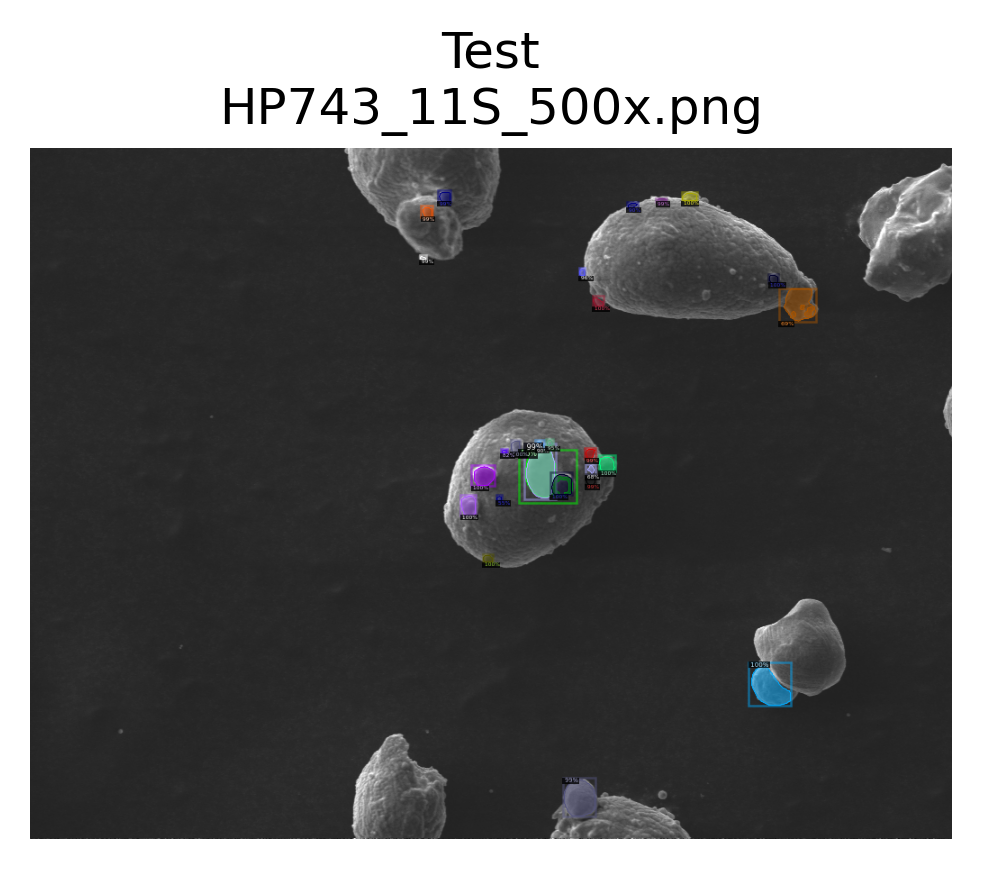

ddict info:
	path: ../data/SEM/HP743_11S_500x.png
	num_instances: 27
Annotating: HP743_12S_250x


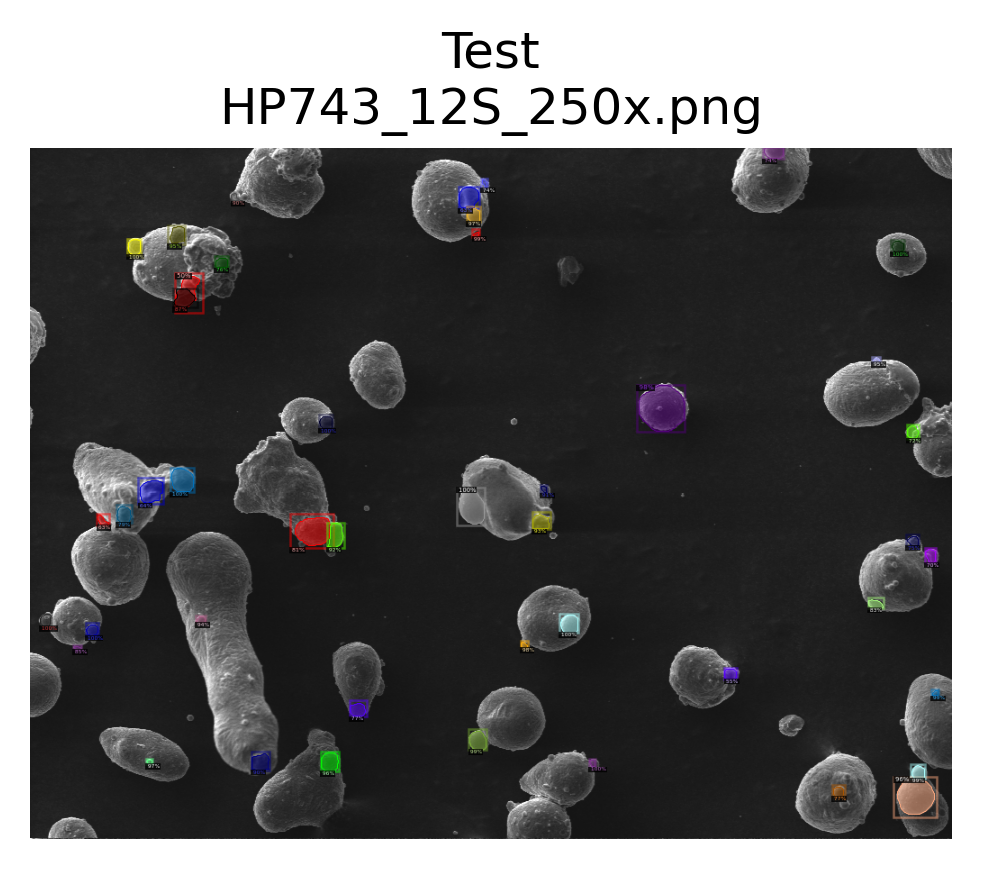

ddict info:
	path: ../data/SEM/HP743_12S_250x.png
	num_instances: 45
Annotating: HP743_12S_500x


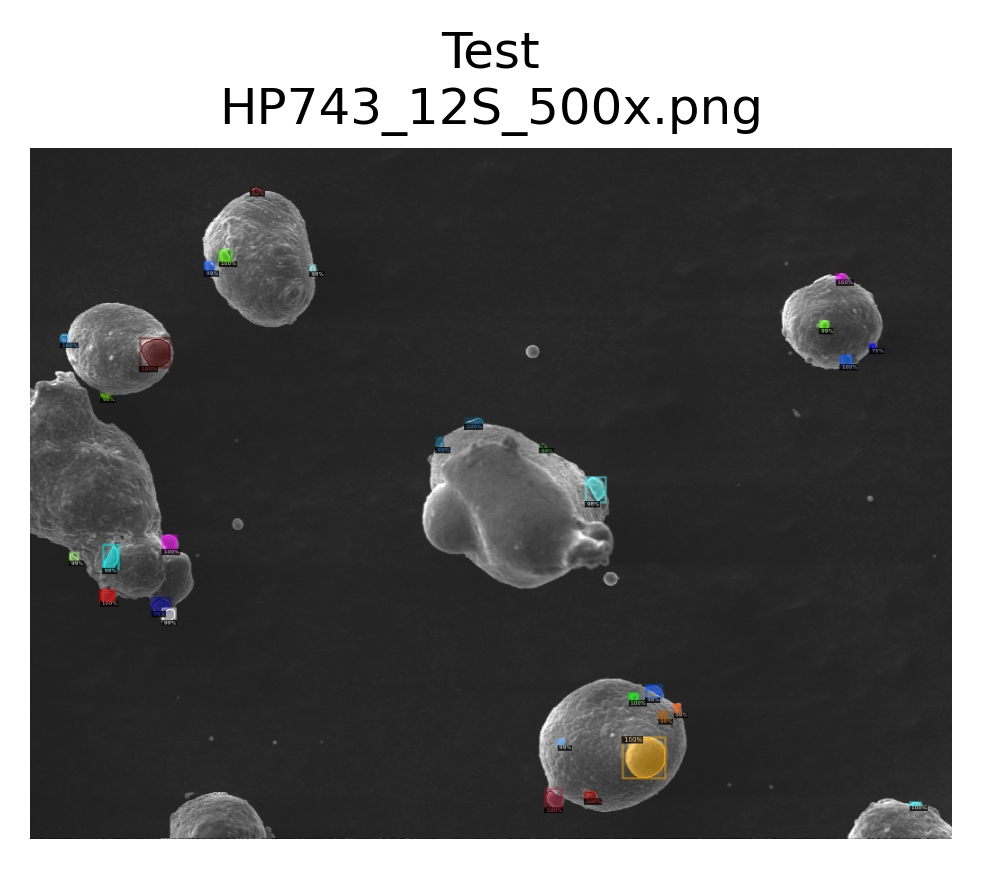

ddict info:
	path: ../data/SEM/HP743_12S_500x.png
	num_instances: 30
Annotating: HP743_1S_250x


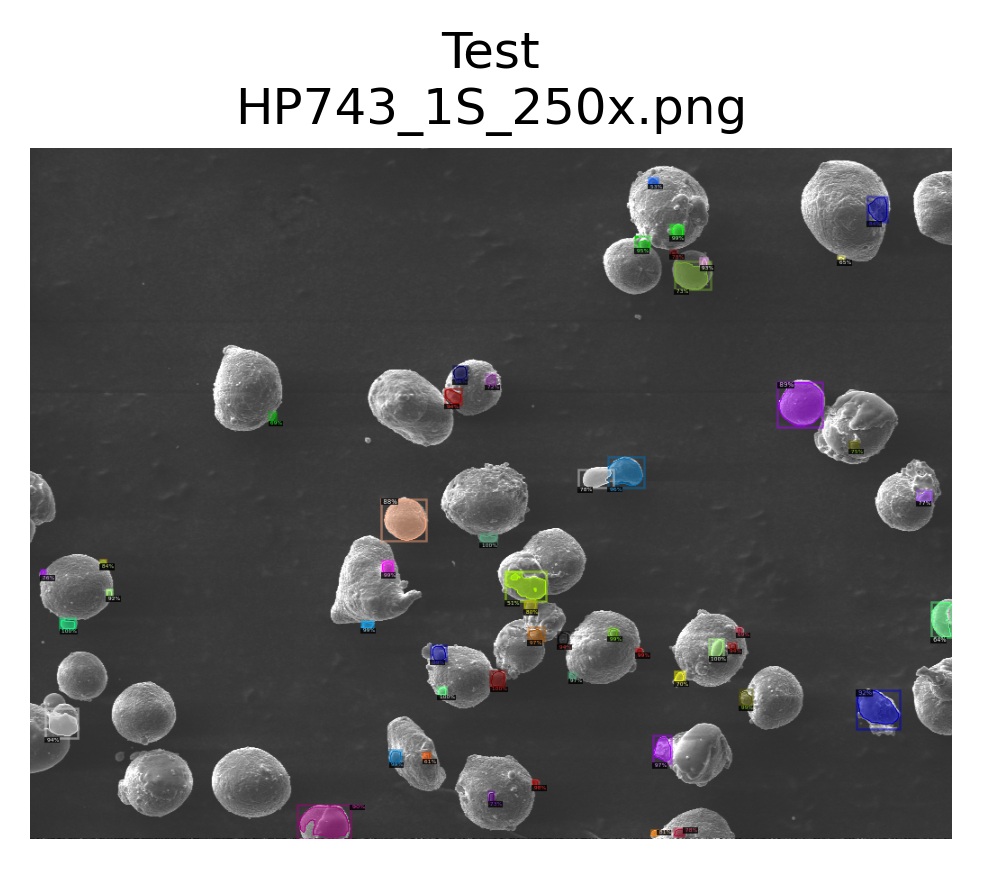

ddict info:
	path: ../data/SEM/HP743_1S_250x.png
	num_instances: 52
Annotating: HP743_1S_500x


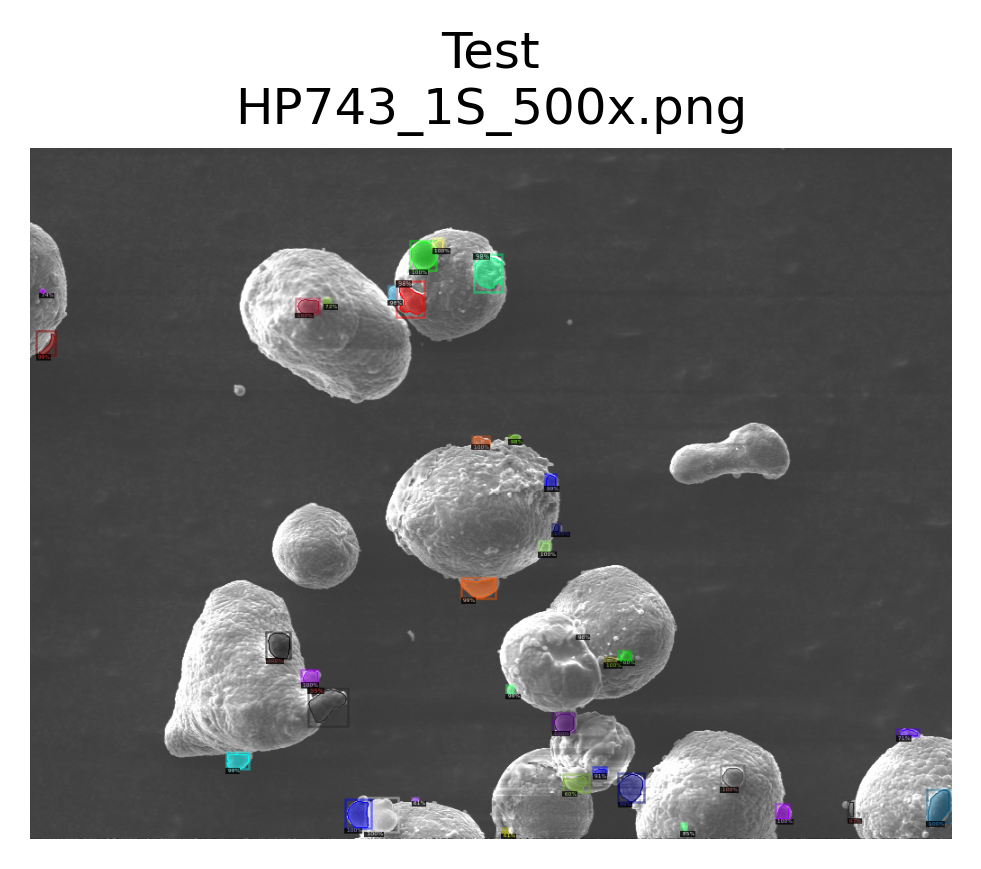

ddict info:
	path: ../data/SEM/HP743_1S_500x.png
	num_instances: 37
Annotating: HP743_2S_250x


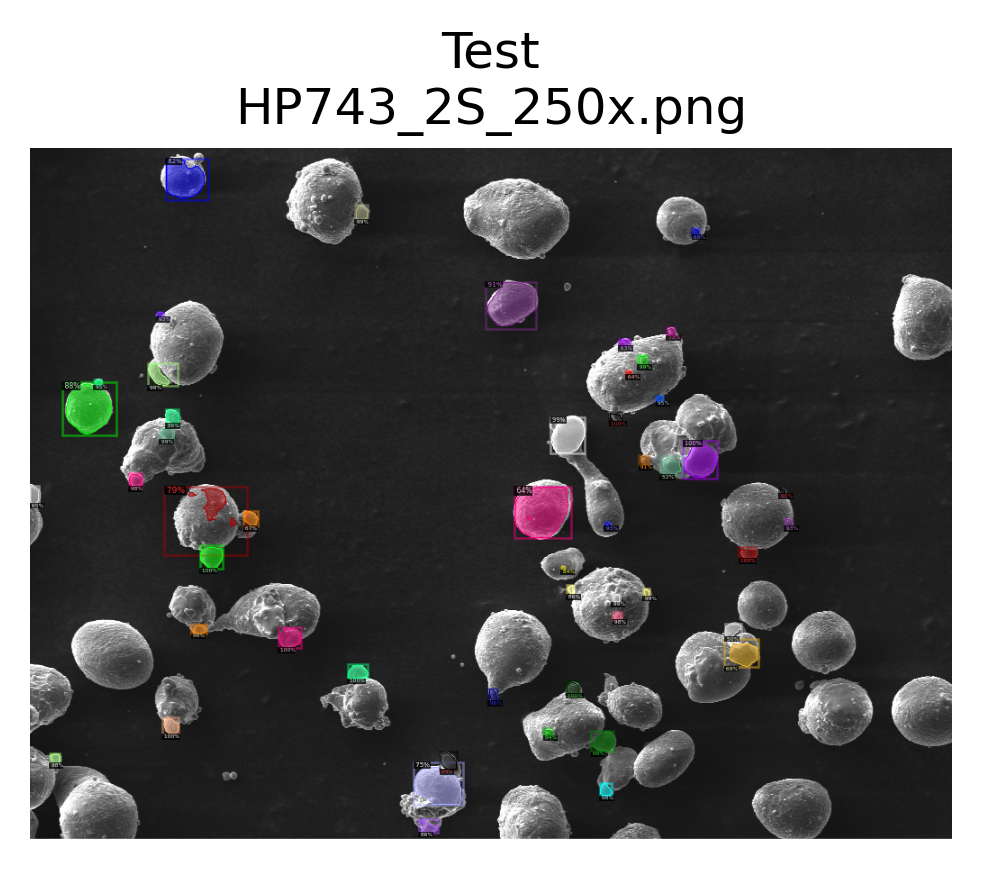

ddict info:
	path: ../data/SEM/HP743_2S_250x.png
	num_instances: 50
Annotating: HP743_2S_500x


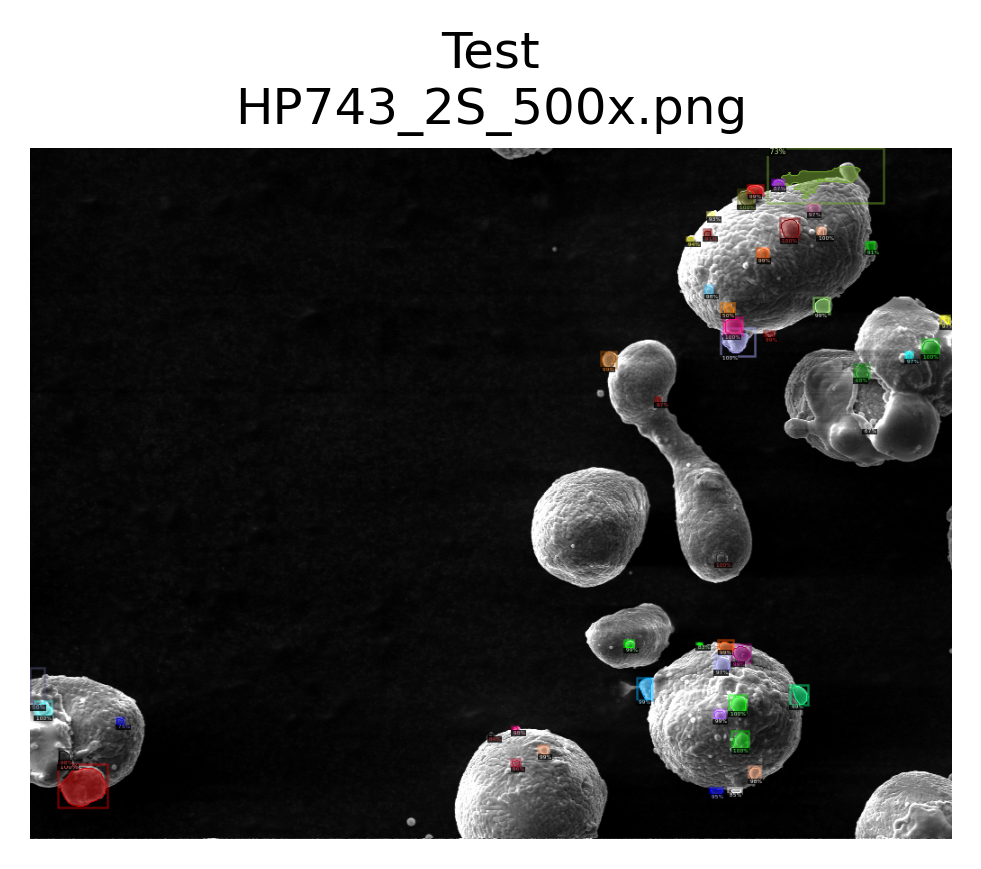

ddict info:
	path: ../data/SEM/HP743_2S_500x.png
	num_instances: 48
Annotating: HP743_3S_250x


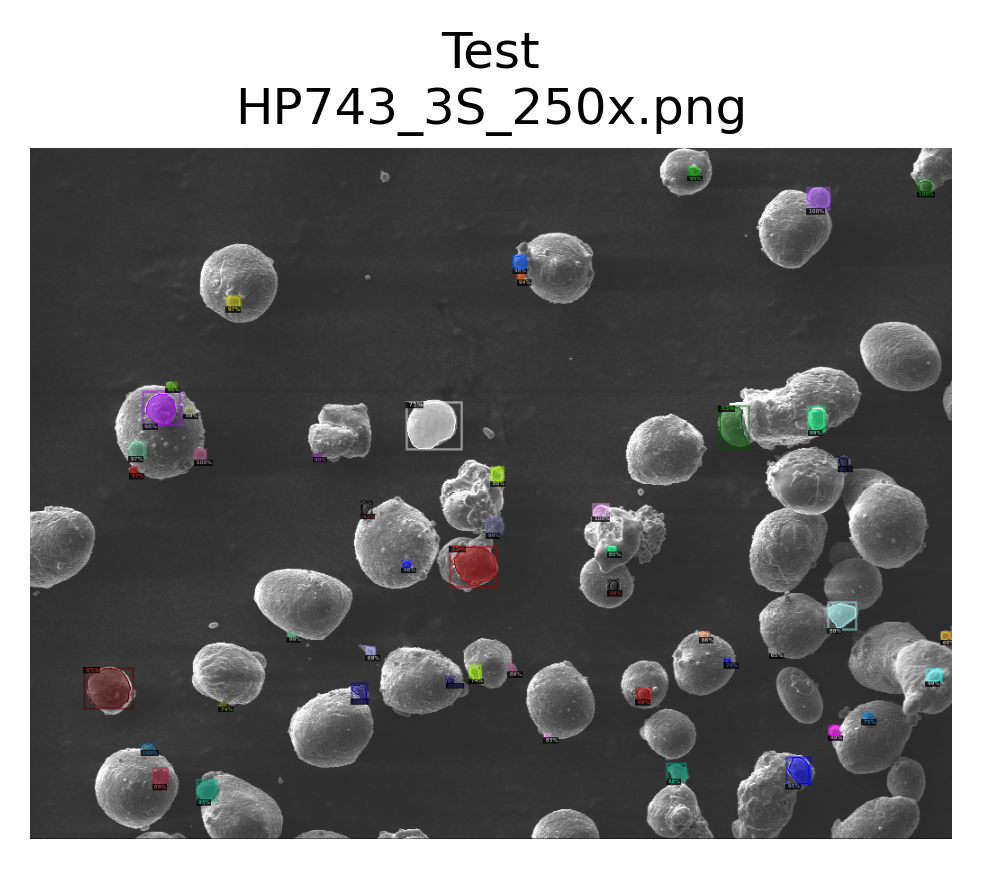

ddict info:
	path: ../data/SEM/HP743_3S_250x.png
	num_instances: 48
Annotating: HP743_3S_500x


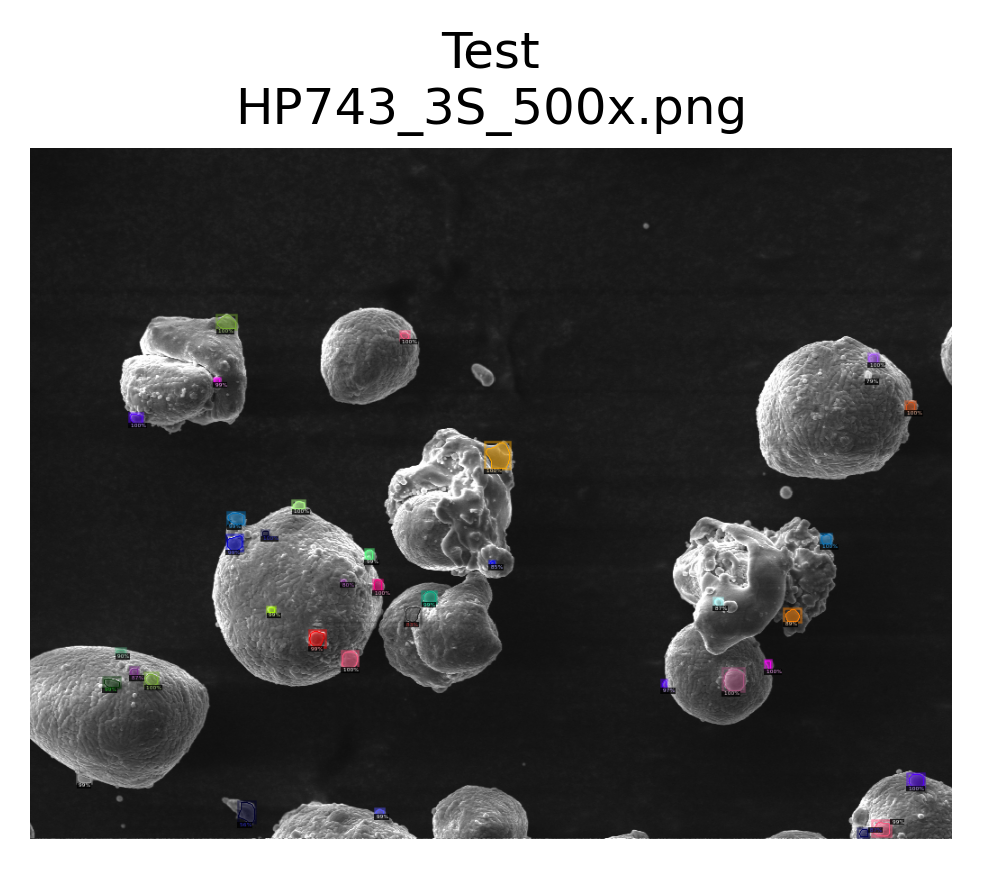

ddict info:
	path: ../data/SEM/HP743_3S_500x.png
	num_instances: 37
Annotating: HP743_4S_250x


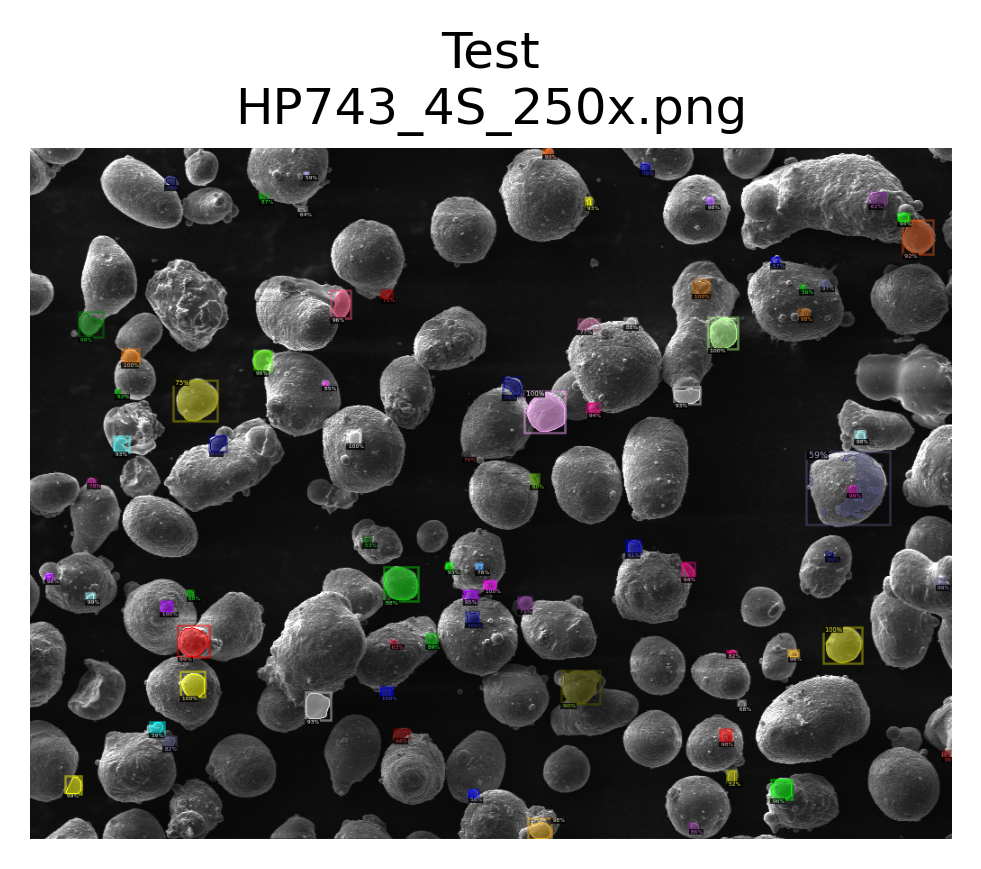

ddict info:
	path: ../data/SEM/HP743_4S_250x.png
	num_instances: 78
Annotating: HP743_4S_500x


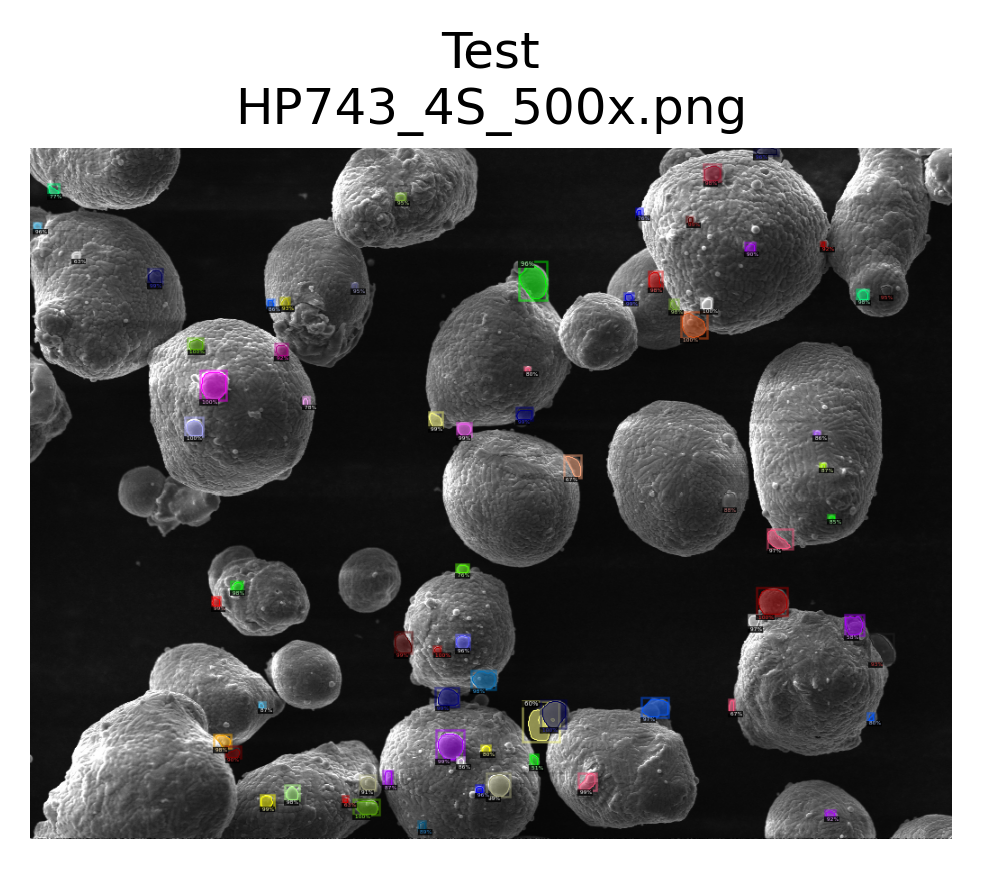

ddict info:
	path: ../data/SEM/HP743_4S_500x.png
	num_instances: 72
Annotating: HP743_5S_250x


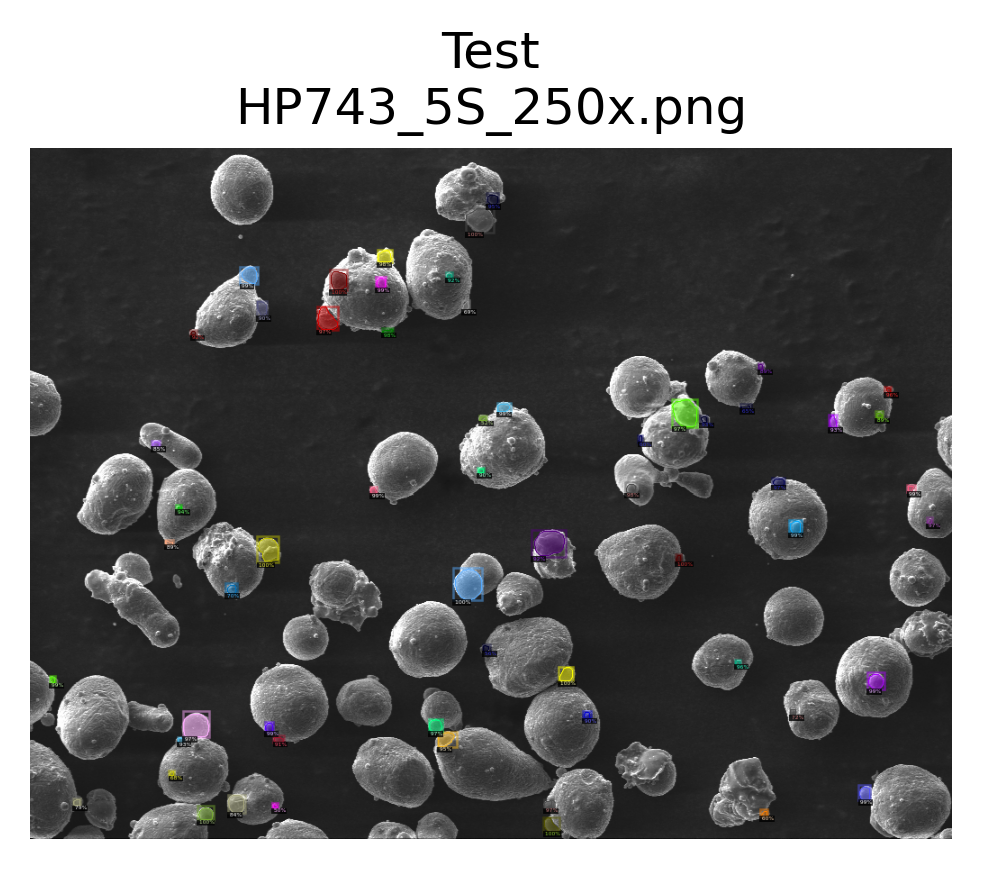

ddict info:
	path: ../data/SEM/HP743_5S_250x.png
	num_instances: 59
Annotating: HP743_5S_500x


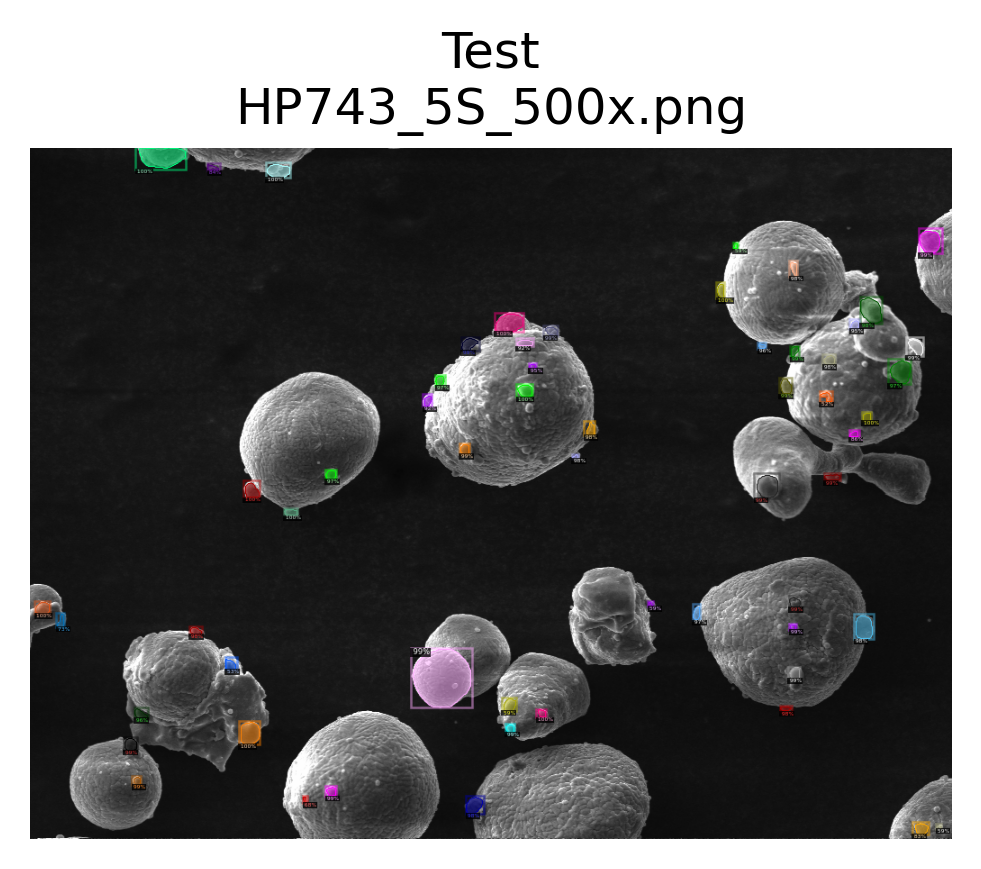

ddict info:
	path: ../data/SEM/HP743_5S_500x.png
	num_instances: 58
Annotating: HP743_6S_250x


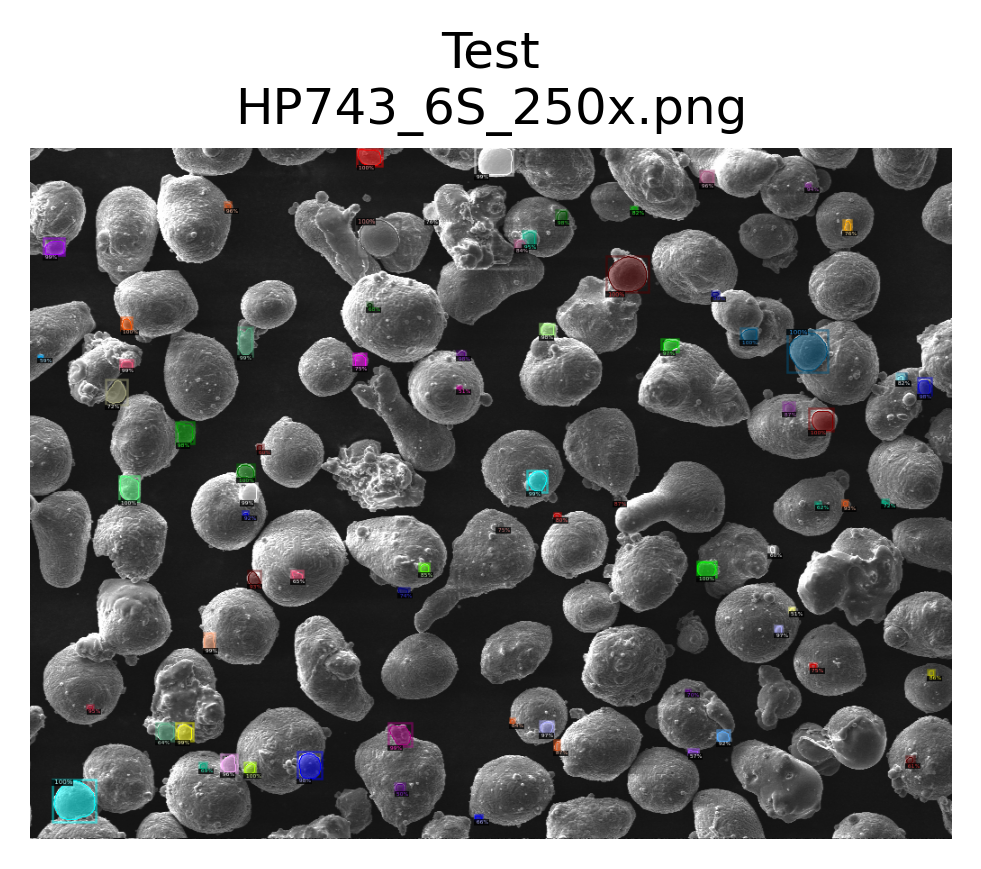

ddict info:
	path: ../data/SEM/HP743_6S_250x.png
	num_instances: 75
Annotating: HP743_7S_250x


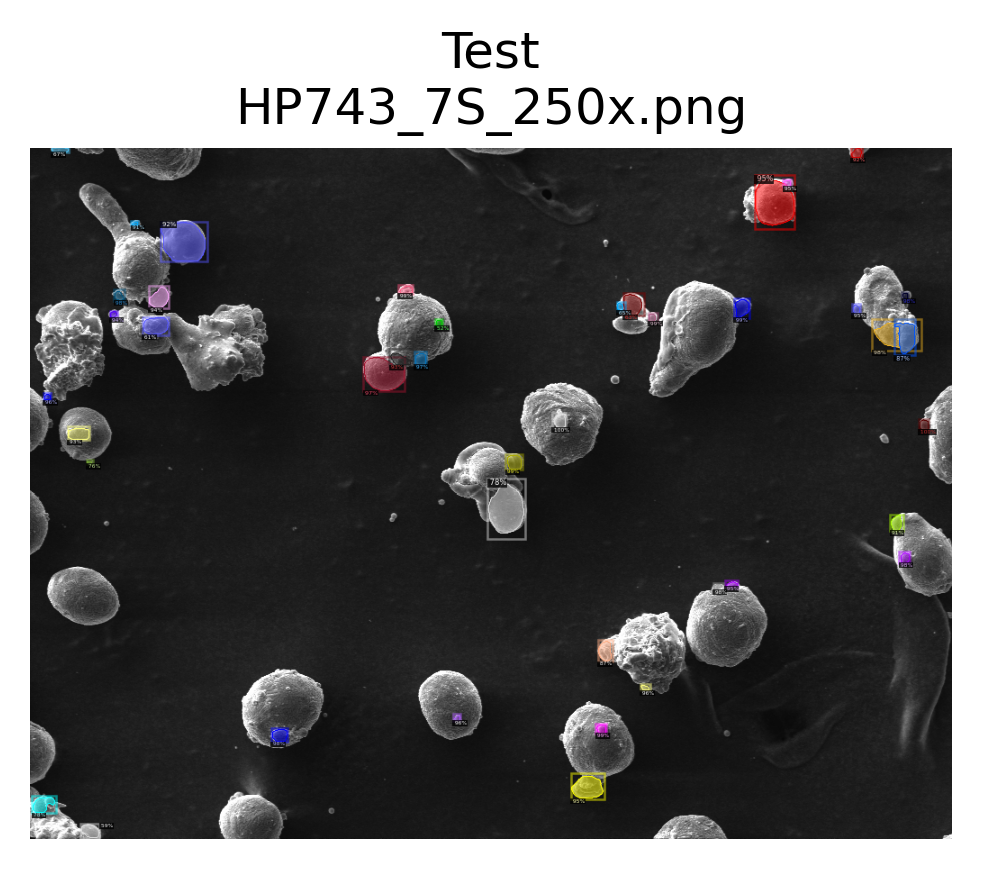

ddict info:
	path: ../data/SEM/HP743_7S_250x.png
	num_instances: 42
Annotating: HP743_7S_500x


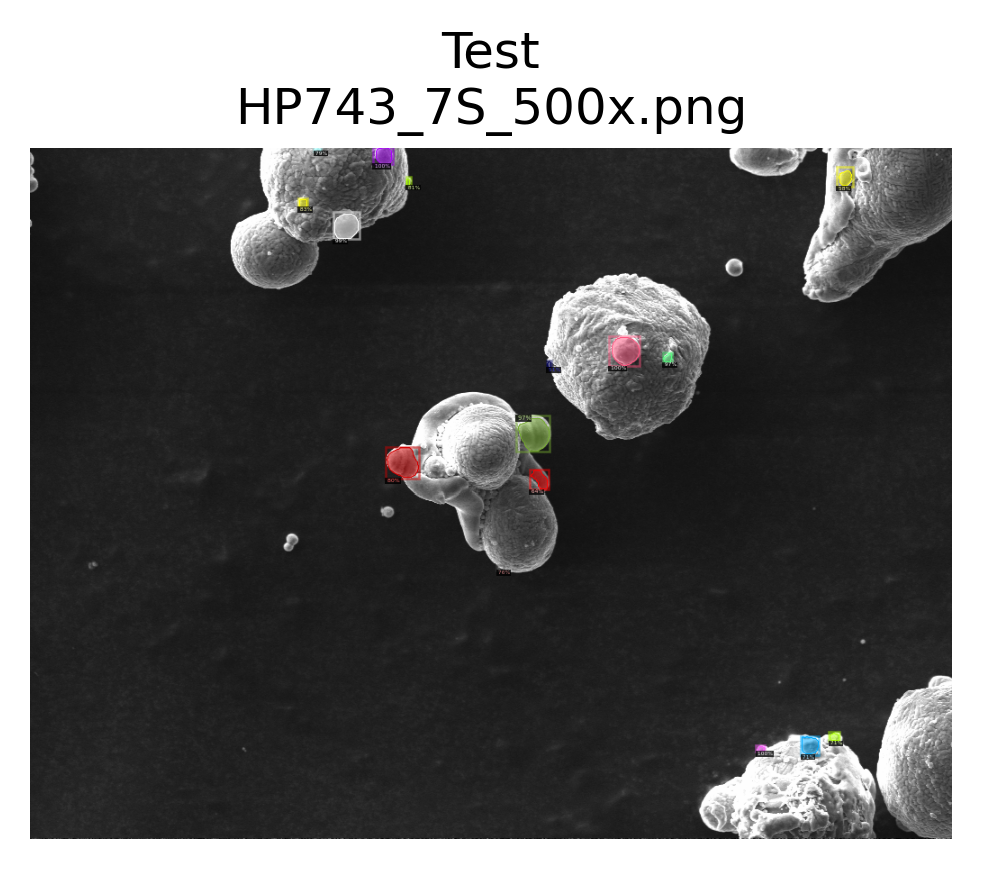

ddict info:
	path: ../data/SEM/HP743_7S_500x.png
	num_instances: 16
Annotating: HP743_8S_250x


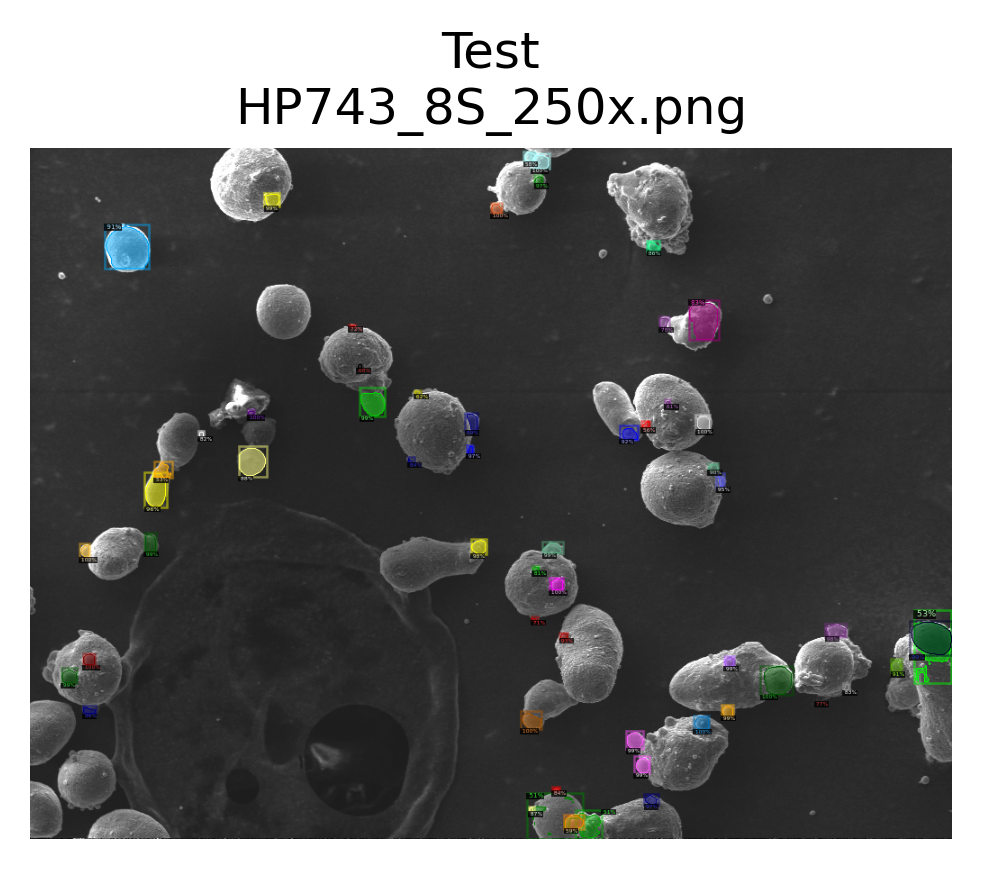

ddict info:
	path: ../data/SEM/HP743_8S_250x.png
	num_instances: 57
Annotating: HP743_8S_500x


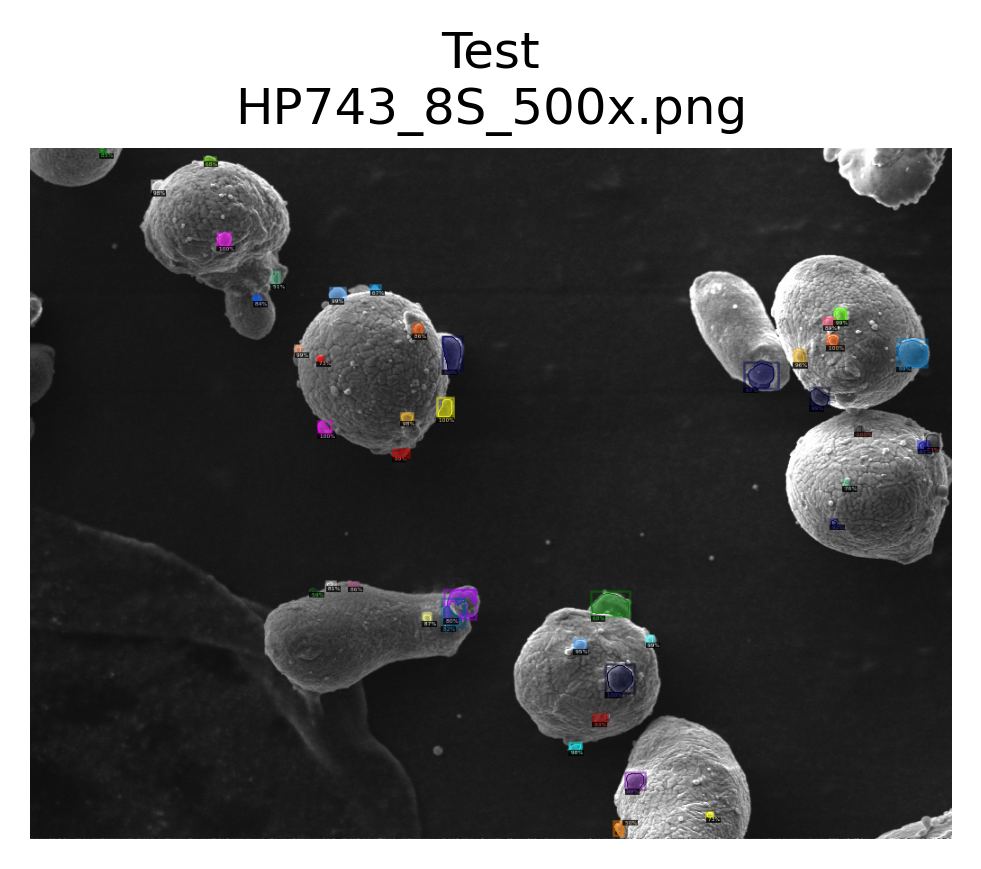

ddict info:
	path: ../data/SEM/HP743_8S_500x.png
	num_instances: 43
Annotating: HP743_9S_250x


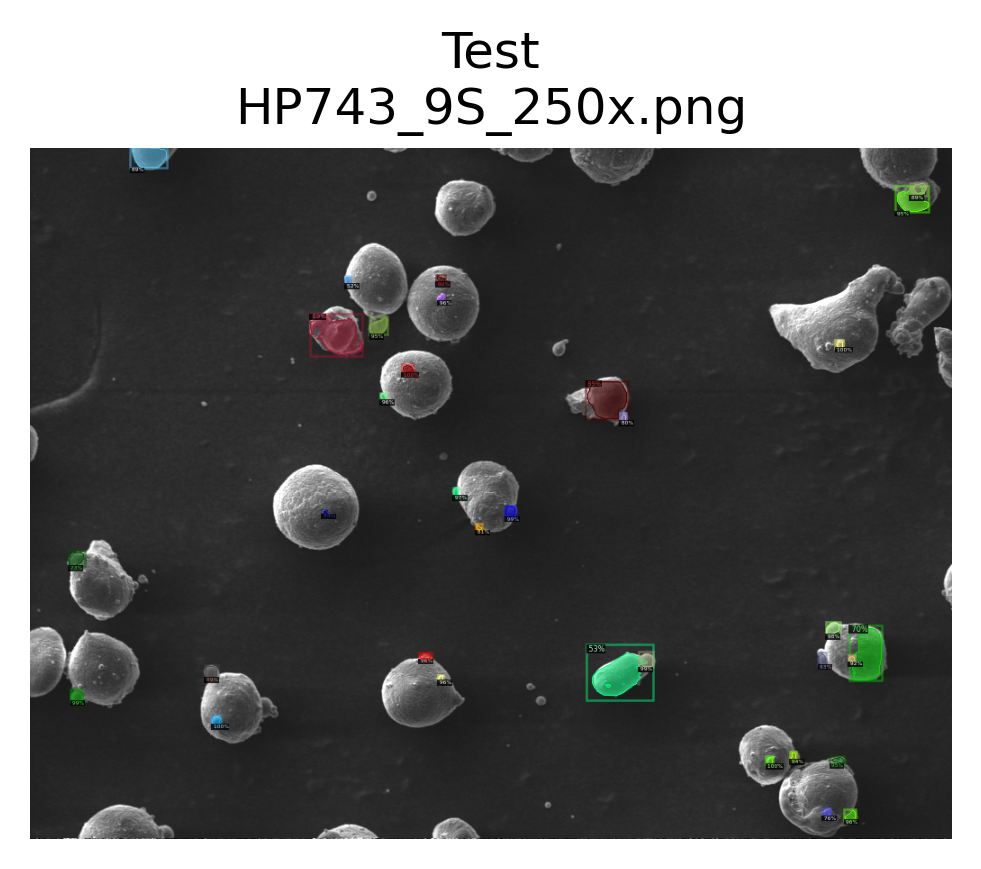

ddict info:
	path: ../data/SEM/HP743_9S_250x.png
	num_instances: 34
Annotating: HP743_9S_500x


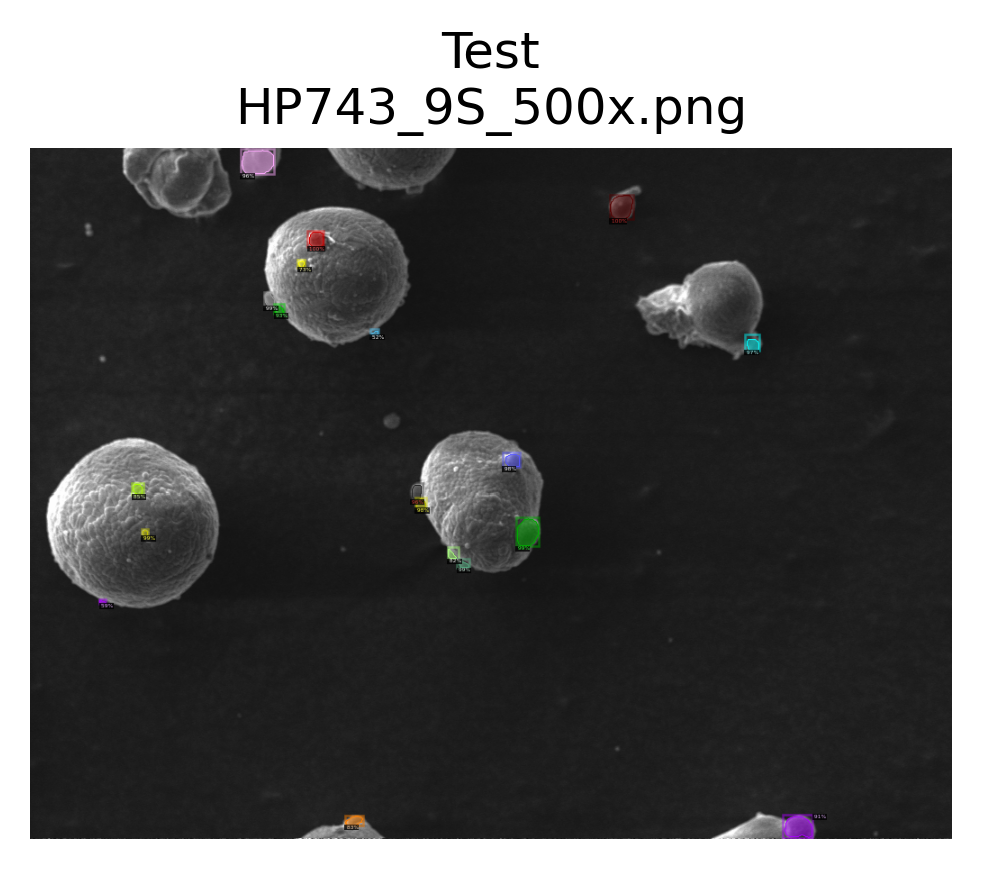

ddict info:
	path: ../data/SEM/HP743_9S_500x.png
	num_instances: 19
Annotating: S01_02_SE1_300X06


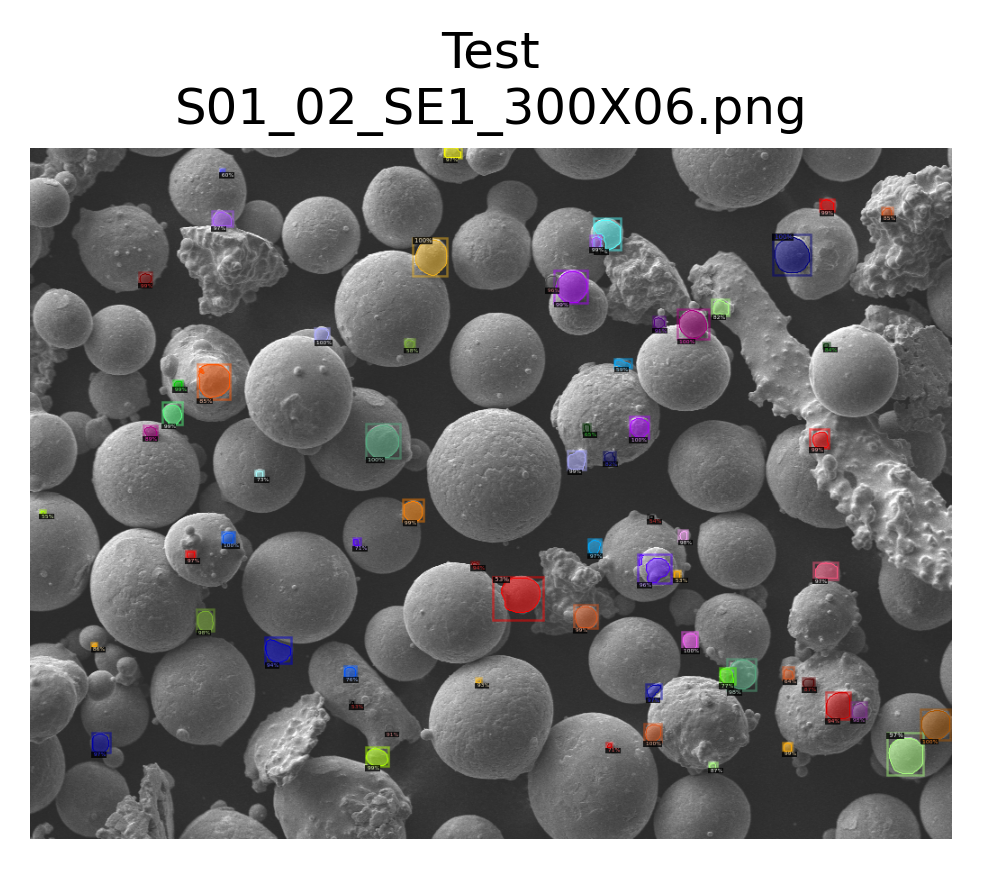

ddict info:
	path: ../data/SEM/S01_02_SE1_300X06.png
	num_instances: 67
Annotating: S01_02_SE1_500X07


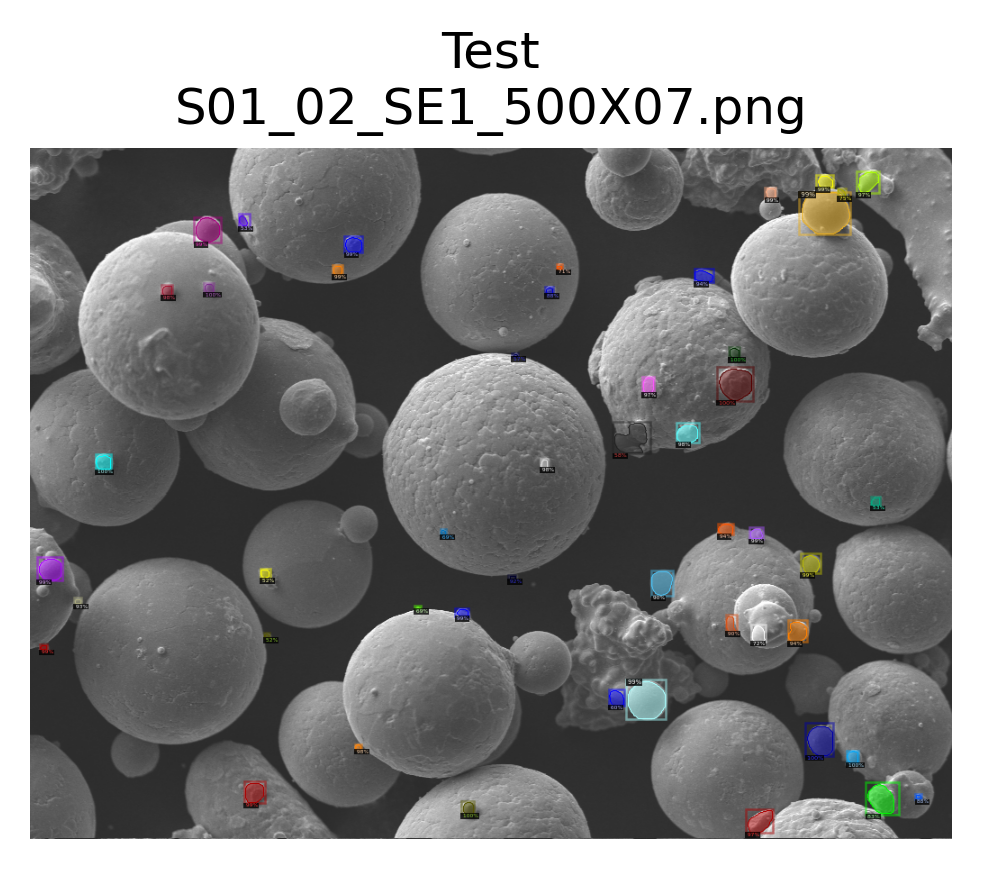

ddict info:
	path: ../data/SEM/S01_02_SE1_500X07.png
	num_instances: 49
Annotating: S01_03_SE1_300X10


In [ ]:
path = root + 'data/SEM'
files = os.listdir(path)
img_names = []
for f in files:
    img_names.append(f.split('.')[0])
    
img_names.sort()
for f in img_names:
    if len(f) > 9:
        print("Annotating: " + f)
        img_path = Path(path, f +'.png') #Collects image name from list
        img = cv2.imread(str(img_path)) #Loads in image
        outs = predictor(img) #Creates Predictions
        export1 = export_anno.make_VIA_file(f +'.png', img_path, outs) #Converts predictions to VIA format
        export_anno.save_to_json(root + 'data/VIA/single_image_annotations/' + f +'_anno.json', export1) #Saves to JSON as specificed location
        outs = predictor(img) #The predictions were converted, so to visualize, they must be recalculated
        data_utils.format_outputs(img_path, dataset='test', pred=outs) #Converts Tensors to RLE format for easier vizualization
        visualize.display_ddicts(ddict=outs,  # predictions to display
                                     outpath=None, dataset='Test',  # don't save fi$
                                     gt=False,  # specifies format as model predict$
                                     img_path=img_path, # path to image
                                     suppress_labels=True, #hides class images
                                     summary=True)  #hides the end print statement